# Avalanche Hazard Mapping in Nubra Valley

## Table of Contents

* [1. Introduction](#1)
* [2. Connect to your GIS](#2)
* [3. Necessary Imports](#3)
* [4. Create Watershed for Nubra river](#4) 
    * [4.1. Get the data for analysis](#5) 
    * [4.2. Fill the DEM](#6)
    * [4.3. Generate flow direction raster](#7)
    * [4.4. Pour Point raster](#8)
    * [4.5. Creating Watershed Raster](#9)
    * [4.6. Convert watershed raster to polygon](#10)
* [5. Clip and generate rasters from DEM](#11)
    * [5.1. Create elevation raster](#12)
    * [5.2. Create slope raster](#13)
    * [5.3. Create aspect raster](#14)
    * [5.4. Create curvature raster](#15)
* [6. Land Use and Land Cover raster](#16)
* [7. Soil raster](#17)
* [8. Snow Avalanche Vulnerability Map](#18)
* [8. Conclusion](#19)

## 1. Introduction <a class="anchor" id="1"></a>

One of the major hazard in higher himalayas are Snow avalanches which are threat to human life. A sudden downward movement of snow or ice is termed as avalanche. An avalanche can be triggered due to heavy snowfall, deforestation, vibrations, change in wind direction & speed, etc. It causes blockage on roads and railways, it also destroys the power supply lines. Deaths caused due to snow avalanches are termed as "White Death". The study area for the current study is Nubra valley. Literature suggests that approximately 75% of the total deaths in Nubra-Shyonk valley are caused due to snow-avalanches. Weighted linear combination (WLC) method based on combined GIS and Remote Sensing techniques was used in the study to create potential hazard map for avalanche. WLC consists three steps, as all datasets are not in the same format which makes it difficult to do any analysis on these datasets. First step is to reclassify all the datasets in same range. Second step is to give scores to the categories of each dataset and last step is to give weights to each dataset based on relative importance and add them together.

## 2. Connect to your GIS <a class="anchor" id="2"></a>

In [1]:
from arcgis.gis import GIS
gis = GIS('GIS')

## 3. Necessary Imports <a class="anchor" id="3"></a>

In [2]:
import arcgis.raster.functions
from arcgis.raster.functions import colormap, remap, slope, aspect, clip, curvature, plus, weighted_sum, con, RFT   
from arcgis.geocoding import geocode
from arcgis.mapping import display_colormaps
arcgis.env.verbose = True
from arcgis.raster.functions.gbl import fill, flow_direction, flow_accumulation, watershed, snap_pour_point

## 4. Create watershed <a class="anchor" id="4"></a>

### 4.1. Get the Digital Elevation Model for analysis <a class="anchor" id="5"></a>

In [3]:
# Aster DEM
dem=gis.content.get("a0192cafcb8443a683b1f1853fd32d96")
dem

<Item title:"dem nubra" type:Imagery Layer owner:priyankatuteja>

### 4.2. Fill <a class="anchor" id="6"></a>

Fill tool is used to remove sinks from the DEM. An outlier cell is known as sink. It is important to fill the sink cells because DEM is used to extract flow path of each cell. The flow path of each cell is estimated from DEM so it is important to fill all the sinks for accurate results. 

In [4]:
fill_dem=fill(dem.layers[0])

In [5]:
fill_lyr=fill_dem.save()

Submitted.
Executing...
Start Time: Thursday, January 23, 2020 4:28:13 AM
Running script GenerateRaster...
Image service {'name': 'GeneratedRasterProduct_F8DRC0', 'serviceUrl': 'https://deeplearningqa.dev.geocloud.com/server/rest/services/Hosted/GeneratedRasterProduct_F8DRC0/ImageServer'} already existed.
Output item id is: 879a39a6df4c423faeb034ff2a16ba50
Output image service url is: https://ip-172-31-38-207.ec2.internal:6443/arcgis/rest/services/Hosted/GeneratedRasterProduct_F8DRC0/ImageServer
Output cloud raster name is: Hosted_GeneratedRasterProduct_F8DRC0.crf
Updating service with data store URI.
Getting image service info...
Updating service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/GeneratedRasterProduct_F8DRC0.ImageServer/edit
Update item service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/GeneratedRasterProduct_F8DRC0.ImageServer successfully.
Portal item refreshed.
Completed script GenerateRaster...
Succeeded at Thur

### 4.3. Flow Direction <a class="anchor" id="7"></a>

In this step, one value is assigned to each cell which represents the flow direction of water considering the topography of the region. This is an important step in hydrological modelling because the flow direction decides the path of the stream or water.

In [6]:
flow_dir=flow_direction(fill_lyr.layers[0], force_flow='NORMAL', flow_direction_type='D8', generate_out_drop_raster=False)

In [7]:
flowdir_lyr=flow_dir.save()

Submitted.
Executing...
Start Time: Thursday, January 23, 2020 4:28:54 AM
Running script GenerateRaster...
Image service {'name': 'GeneratedRasterProduct_19CFZD', 'serviceUrl': 'https://deeplearningqa.dev.geocloud.com/server/rest/services/Hosted/GeneratedRasterProduct_19CFZD/ImageServer'} already existed.
Output item id is: 0e01767830a245f58d27b0a954cfc001
Output image service url is: https://ip-172-31-38-207.ec2.internal:6443/arcgis/rest/services/Hosted/GeneratedRasterProduct_19CFZD/ImageServer
Output cloud raster name is: Hosted_GeneratedRasterProduct_19CFZD.crf
Updating service with data store URI.
Getting image service info...
Updating service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/GeneratedRasterProduct_19CFZD.ImageServer/edit
Update item service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/GeneratedRasterProduct_19CFZD.ImageServer successfully.
Portal item refreshed.
Completed script GenerateRaster...
Succeeded at Thur

### 4.4. Pour Point Raster <a class="anchor" id="8"></a>

In this step, raster showing the cell above which the contributing area will be taken for watershed generation. Location of pour point is important for delineation of watershed.

In [8]:
pour_point=gis.content.get("fc959d9fec9e4dd1a7122389e4db7b12")
pour_point

<Item title:"pourpoint" type:Imagery Layer owner:priyankatuteja>

### 4.5. Creating Watershed Raster <a class="anchor" id="9"></a>

Watershed is an upstream area physically delineated from an outlet pour point, it is also known as basin or catchment area. In the current study, Watershed for nubra river was delineated using ArcGIS API raster function.

In [9]:
basin=watershed(flowdir_lyr.layers[0], pour_point.layers[0], pour_point_field='Value')

In [10]:
basin_lyr=basin.save()

Submitted.
Executing...
Start Time: Thursday, January 23, 2020 4:29:28 AM
Running script GenerateRaster...
Image service {'name': 'GeneratedRasterProduct_MYDSZ0', 'serviceUrl': 'https://deeplearningqa.dev.geocloud.com/server/rest/services/Hosted/GeneratedRasterProduct_MYDSZ0/ImageServer'} already existed.
Output item id is: 34a2f7d959ea45a8b3f91b51e6c9abb1
Output image service url is: https://ip-172-31-38-207.ec2.internal:6443/arcgis/rest/services/Hosted/GeneratedRasterProduct_MYDSZ0/ImageServer
Output cloud raster name is: Hosted_GeneratedRasterProduct_MYDSZ0.crf
Updating service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/GeneratedRasterProduct_MYDSZ0.ImageServer/edit
Update item service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/GeneratedRasterProduct_MYDSZ0.ImageServer successfully.
Portal item refreshed.
Completed script GenerateRaster...
Succeeded at Thursday, January 23, 2020 4:30:06 AM (Elapsed Time: 37.71 seconds)
Gene

### 4.6. Converting watershed raster to polygon <a class="anchor" id="10"></a>

Geoprocessing analysis can be easily done on vector data rather than the raster data. The `raster watershed` is converted into `vector (polygons)` watersheds.

In [11]:
watershed_poly = basin_lyr.layers[0].to_features(output_name="poly_basin11")

Submitted.
Executing...
Start Time: Thursday, January 23, 2020 4:30:42 AM
Running script ConvertRasterToFeature...
Publishing Privilege Check: OK
Using full extent of input dataset.
Converting raster to polygon...
Creating drawing info for output feature layer.
Create popup info for output feature layer.
ConvertRasterToFeature GP Job: j41fe245a2ded4606aff86d173dc82488 finished successfully.


In [12]:
watershed_poly.layers[0]

<FeatureLayer url:"https://deeplearningqa.dev.geocloud.com/server/rest/services/Hosted/poly_basin11/FeatureServer/0">

In [13]:
watershed_boundary=watershed_poly
watershed_layer=watershed_boundary.layers[0]
watershed_feature = watershed_layer.query(where='OBJECTID=1')
watershed_feature.features[0].extent=dem.layers[0].extent
watershed_geom=watershed_feature.features[0].geometry
watershed_geom['spatialReference'] = {'wkid':3857}

In [14]:
m = gis.map('Kargil, India')
m.add_layer(watershed_poly)
m.legend = True

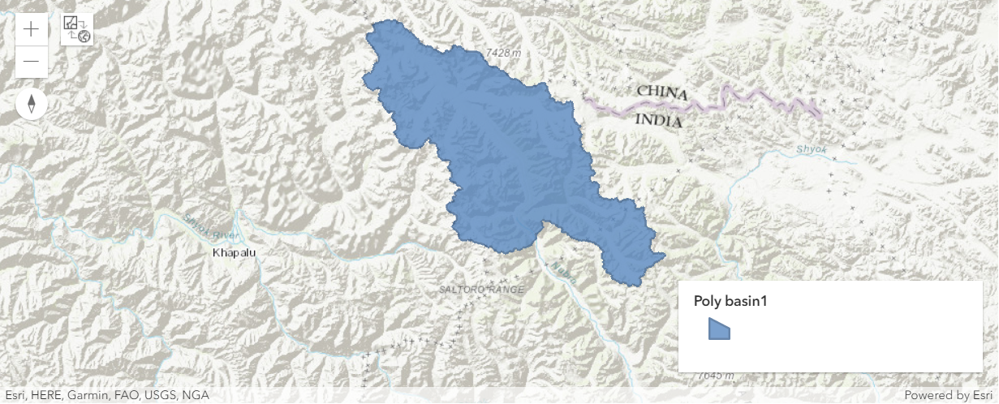

In WLC, first all the datasets were reclassified and scores were given to them so that all are in same numbering system with same range. Each raster is reclassified and scores ranges between 0 to 10 where high score shows extremely vulnerable and 0 indicates no danger or less vulnerable. 

For further analysis all the datasets were clipped with the watershed boundary.

### 5. Clip Dem with Nubra watershed boundary <a class="anchor" id="11"></a>

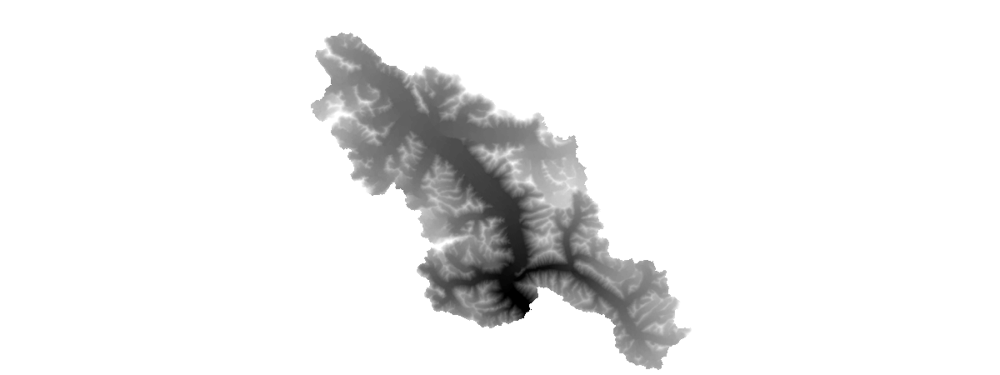

In [15]:
dem_clip=clip(dem.layers[0], watershed_geom)
dem_clip

## 5.1. Creating elevation raster <a class="anchor" id="12"></a>

Elevation does not directly affect the avalanche occurrence, but meteorological factors which affects the snowpack stability i.e. temperature, wind speed, amount and type of precipitation are directly related to elevation.

Generally with increase in elevation, the air temperature decreases while the wind speed increases. Past studies shows that most of the avalanches occurs between 2700m to 6000m and highly destructive avalanches occurs between 5000m to 5600m.

The study area DEM has elevation between 3570m to 7637m. The elevation raster was created by reclassifying the DEM. DEM is reclassified into 5 classes and scores were given to each class between 1 to 10 where 0 means not vulnerable and 10 means highly vulnerable to snow avalanche. Elevation classes between 4383 to 6824 were given 10 and elevation class showing 6824 to 7637 was given 1 because literature shows elevation above 6200m is least vulnerable for avalanche.

In [16]:
elevation=colormap(remap(dem_clip,
                     input_ranges=[3570, 4383.4,   #9
                                   4383.4, 5196.8, #10
                                   5196.8, 6010.2, #10
                                   6010.2, 6823.6, #3
                                   6823.6, 7637], #1
                     output_values=[4, 5, 5, 2, 1], 
                     astype='u8'),
               colormap=[[1, 255, 255, 204], [2, 0, 100, 0],
                         [4, 255, 127, 80], [5, 255, 0, 0]])

In [17]:
m = gis.map('Kargil, India')
m.add_layer(elevation)
m.legend = True
m

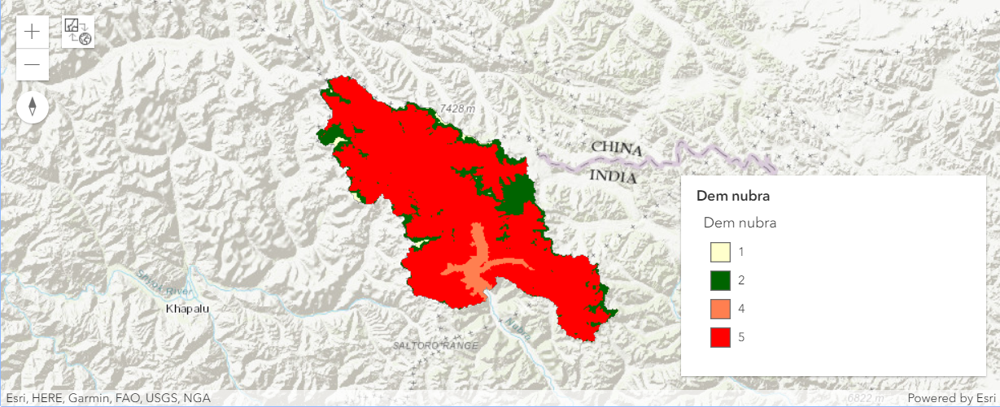

## 5.2. Creating slope raster from DEM <a class="anchor" id="13"></a>

Slope is one of the important factor for avalanche occurence. The slope map was created and reclassified into 5 classes. According to the past studies most of the avalaches occured on slope between 28 to 45 degrees. The slope less than 25 degrees is less vulnerable to avalache. The steep slopes also not supports the accumulation of snow.

In [18]:
slope_s=colormap(remap(slope(dem_clip),
                     input_ranges=[0,  12,  # Flat #1
                                   12, 28,  # Low #5
                                   28, 45,  # Highly vulnerable (10)
                                   45, 55,  # Steep #6
                                   55, 91], # Very Steep #1
                     output_values=[1, 1, 5, 2, 1],
                     astype='u8'),
               colormap=[[1, 141, 212, 0], [2, 255, 225, 204],
                         [5, 255, 0, 0]])

In [19]:
m = gis.map('Kargil, India')
m.add_layer(slope_s)
m.legend = True
m

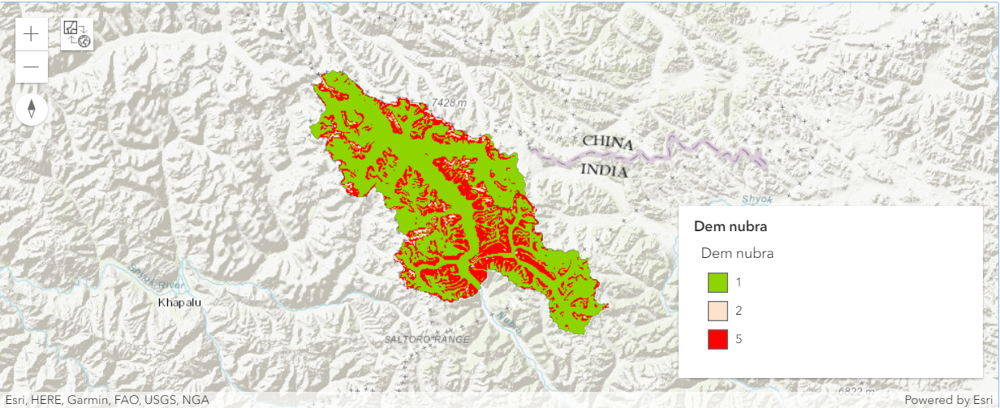

## 5.3. Create Aspect raster from DEM <a class="anchor" id="14"></a>

The snowpack stability is directly affected by orientation of slope with respect to the sun. The slopes facing the sun stabilizes faster in comparison to the shaded slopes which stays unstable. The Aspect raster was reclassified into 10 clases are different scores were given to each class.

In [20]:
aspect_s=colormap(remap(aspect(dem_clip),
                     input_ranges=[-1, 0, #Flat #1
                                   0, 22.5,  # North #10
                                   22.5, 67.5,  # Northeast #10
                                   67.5, 112.5,  # East #3
                                   112.5, 157.5, # Southeast #5
                                   157.5, 202.5, # South #1
                                   202.5, 247.5, # Southwest #1
                                   247.5, 292.5, # West #1
                                   292.5, 337.5, # Northwest #8
                                   337.5, 360], # North #10
                     output_values=[1, 5, 5, 1, 2, 1, 1, 1, 4, 5],
                     astype='u8'),
               colormap=[[1, 255, 255, 204],[2, 255, 255, 0],
                         [4, 255, 178, 102],[5, 255, 0, 0]])

In [21]:
m = gis.map('Kargil, India')
m.add_layer(aspect_s)
m.legend = True
m

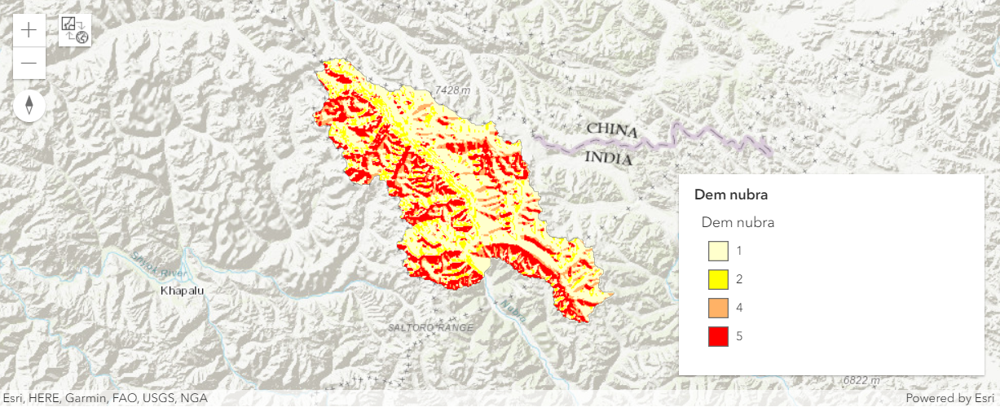

## 5.4. Create Curvature raster from DEM <a class="anchor" id="15"></a>

Curvature is also an important parameter for avalanche hazard mapping. Snowpack over the convex surfaces are unstable in comprison to the concave surfaces. Concave surface is able to hold large amount of snow. 

The curvature raster was reclassified into 3 classes and convex slope was given score 10 as it is more vulnerable to avalanche. 1 score is assigned to concave surface as it is least vulnerable.

In [22]:
curvature=curvature(dem_clip, curvature_type='standard', z_factor=1, astype='F32')

In [23]:
curvature_s=colormap(remap(curvature,
                     input_ranges=[-60, 0, #concave slope #1
                                   0, 0, #flat slope #5
                                   0.000001, 60], #convex slope #10
                     output_values=[1, 3, 5], 
                     astype='F32'),
               colormap=[[1, 255, 255, 204],
                         [3, 255, 178, 102],
                         [5, 255, 0, 0]])

In [24]:
m = gis.map('Kargil, India')
m.add_layer(curvature_s)
m.legend = True
m

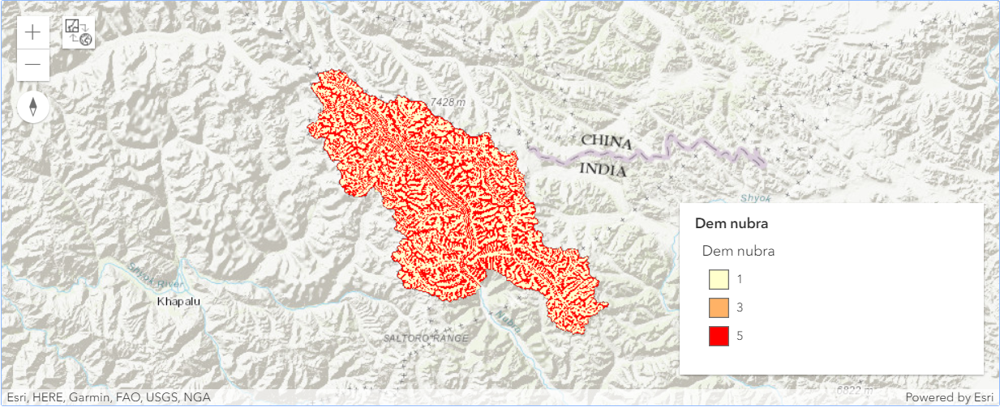

## 6. Land Use and Land Cover <a class="anchor" id="16"></a>

The LULC data from [ORNL DAAC](https://daac.ornl.gov/VEGETATION/guides/Decadal_LULC_India.html) was used for the year 2005. The raster is of 100m resolution. The LULC was created from  Landsat 4 & 5, India Remote Sensing satellites (IRS) Resourcesat, LISS-I & LISS-III data, ground truth data and visual interpretation. The International Geosphere-Biosphere Programme (IGBP) classification scheme was used. The data is resampled in 30m spatial resolution similar to the DEM data so that the overlay analysis can be done. LULC plays an important parameter. The area with dense vegetation is less vulnerable than the area with no vegetation. Snow and Ice covered area are more vulnerable to snow avalanche than the barren land so, more score was given to Ice and Snow class.

In [25]:
lulc=gis.content.get("680534dfa94f47c5827ada15be529087")
lulc

<Item title:"lulcraster" type:Imagery Layer owner:priyankatuteja>

The LULC data is clipped with the watershed boundary.

In [26]:
lulc_clip=clip(lulc.layers[0], watershed_geom)

The study area has two LULC classes, Barren land and Snow & Ice. The raster is reclassified and scores were given to the LULC classes. As Snow & Ice class is highly vulnerable to snow avalches 10 score is given to it. Score 6 was given to the Barrenland class as it is moderately vulnerable.

In [27]:
lulc_c=colormap(remap(lulc_clip,
                     input_ranges=[6, 6,
                                   18, 18],
                     output_values=[3, 5], 
                     astype='u8'),
         colormap=[[3, 141, 212, 0], # Barren land #5
                   [5, 255, 128, 0]])# Snow & Ice #10

In [28]:
m = gis.map('Kargil, India')
m.add_layer(lulc_c)
m.legend = True
m

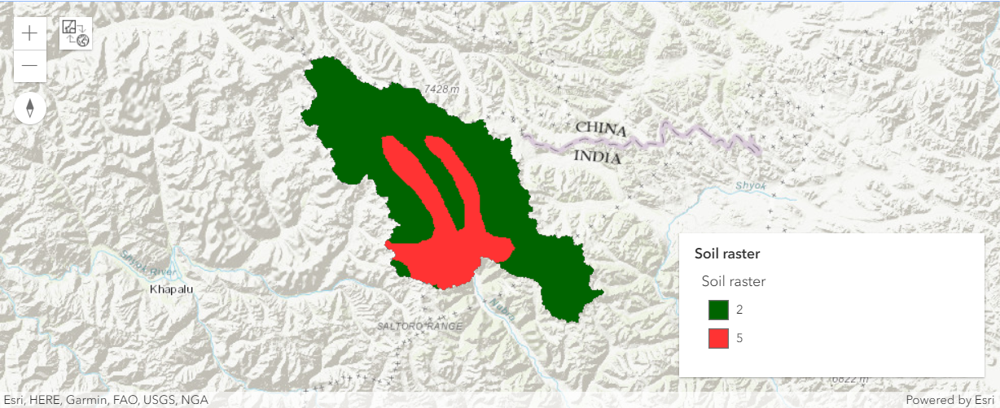

## 7. Soil <a class="anchor" id="17"></a>

The FAO-UNESCO Soil Map of the World was published between 1974 and 1978 at 1:5 000 000 scale. Source: Land and Water Development Division, FAO, Rome. The data is in the form of shapefile, The vector data was converted into raster with 30m spatial resolution. 

In [29]:
soil=gis.content.get("08d70dcf766649c5b171dbed16e4196b")
soil

<Item title:"soil raster" type:Imagery Layer owner:priyankatuteja>

The soil raster was clipped with watershed boundaries.

In [30]:
soil_clip=clip(soil.layers[0], watershed_geom)
soil_s= lulc_c=colormap(remap(soil_clip,
                     input_ranges=[1, 1, 
                                   2, 2],
                     output_values=[2, 5], 
                     astype='u8'),
         colormap=[[2, 0, 100, 0],
                   [5, 255, 51, 51]])

In [31]:
m = gis.map('Kargil, India')
m.add_layer(soil_s)
m.legend = True
m

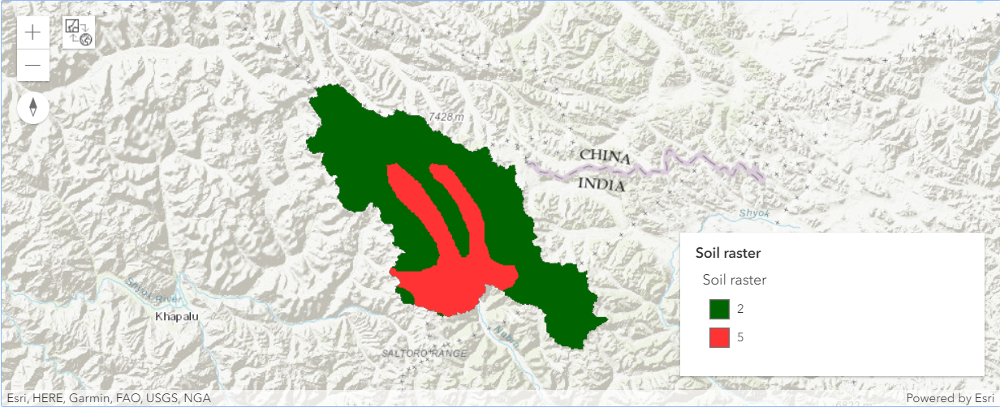

## 8. Snow Avalanche Vulnerability Map <a class="anchor" id="18"></a>

WLC is a hybrid between qualitative and quantitative methods. Weights were given to all six parameters on the basis of relative importance. In the current study highest weight is assigned to the slope because in snow avalanche most important factor is slope. The total weight should be 100% after being added so that the output can be consistent. 

In [32]:
risk_map = (0.1*elevation+0.4*slope_s+0.1*aspect_s+0.2*curvature_s+0.1*lulc_c+0.1*soil_s)

In [33]:
avalanche_risk_map = colormap(risk_map,
                         colormap = [[1, 0,100, 0], [2, 154, 205, 50], 
                                     [3, 255, 255, 0,], [4, 255, 127, 80], 
                                     [5, 255, 0, 0]],
                         astype='u8')

In [34]:
m = gis.map('Kargil, India')
m.add_layer(avalanche_risk_map)
m.legend = True
m

MapView(layout=Layout(height='400px', width='100%'), legend=True)

From, this analysis the output potential avalanche hazard map will have values from 1 to 5 where, 1 represents less vulnerability and the vulnerability increases as the class increases from 1 to 5. But if the rasters shows the classes in string instead of integer it will be more meaningful so this step can be done in ArcGIS Pro using `Raster Symbology`.

In [35]:
# Save the raster
hazrdmap=avalanche_risk_map.save(output_name="risk_map")

Submitted.
Executing...
Start Time: Thursday, January 23, 2020 6:02:26 AM
Running script GenerateRaster...
Image service {'name': 'risk_map', 'serviceUrl': 'https://deeplearningqa.dev.geocloud.com/server/rest/services/Hosted/risk_map/ImageServer'} already existed.
Output item id is: ec579a4a2336400c8f0eaafe7d8acb91
Output image service url is: https://ip-172-31-38-207.ec2.internal:6443/arcgis/rest/services/Hosted/risk_map/ImageServer
Output cloud raster name is: Hosted_risk_map.crf
Updating service with data store URI.
Getting image service info...
Updating service: https://ip-172-31-38-207.ec2.internal:6443/arcgis/admin/services/Hosted/risk_map.ImageServer/edit
Completed script GenerateRaster...
Succeeded at Thursday, January 23, 2020 6:02:46 AM (Elapsed Time: 19.93 seconds)
GenerateRaster GP Job: j4b917857d0a94dd5b1dfca380ef71782 finished successfully.


In [36]:
potential_risk_map=gis.content.get("b900e68056c149babfba028c5d625507")

In [37]:
m = gis.map('Kargil, India')
m.add_layer(potential_risk_map)
m.legend = True
m

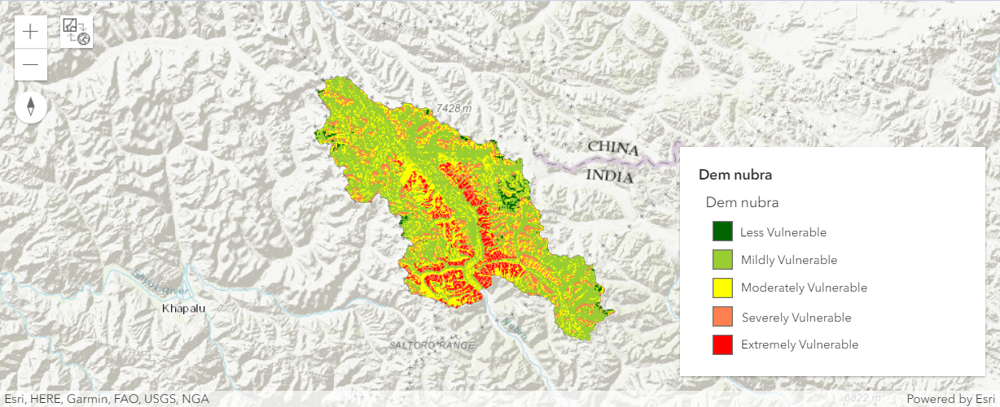

In the map, the moraine is mildly vulnerable. The steep convex slopes are the extremely vulnerable regions of the study area. As we discussed above that the areas above 6500m elevation are less vulnerable, dark green colour area are the mountain peaks with elevation more than 6500m. The graph below is showing the whole workflow for snow avalanche vulnerability map creation using ArcGIS Python API.

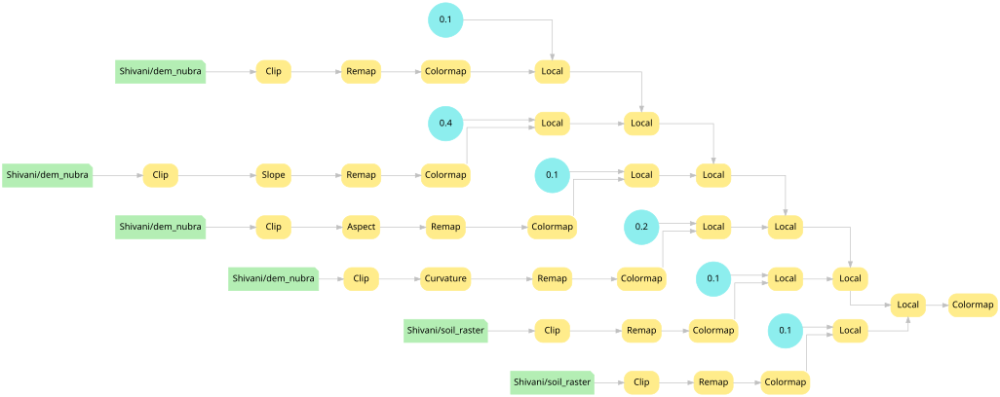

In [38]:
avalanche_risk_map.draw_graph()

## 9. Conclusion <a class="anchor" id="19"></a>

Siachen or nubra basin expriences snow avalches every year which causes deaths of army soldiers and locals. In this sample, raster functions were used to create snow avalanche hazard map. From DEM, slope, aspect and curvature rasters were created. LULC and Soil maps were also created. Weighted Linear Combinations (WLC) model incorporated with GIS was used to create hazard map. WLC model is widely acceptable for natural disasters mapping. The model is able to handle and integrate large volume of data. The same workflow can be used to create avalanche hazard map for different regions.